## Search PatCID with Patent Query

This notebook illustrates how to retrieve molecules referenced in a patent of interest. The schema of the dataset is detailed [here]().

#### 1. Import dependencies

In [3]:
%%capture
%load_ext autoreload
%autoreload 2

import ast
import os
import subprocess
import pandas as pd
import mols2grid
from rdkit import Chem
from pdf2image import convert_from_path
from src.display import display_molecules_locations

#### 2. Search patent 

In [5]:
# Define a query patent 
query_patent = "US10526338"
# US: publication number (ex: "US10526338")
# JPO publication number (ex: "JP2022502495")
# CNIPA: publication number (ex: "CN103119160")
# EPO application number (ex: "EP14720074B1") 
# KIPO: application number (ex: "KR1020200102763")

In [2]:
query_patent = "US20220127225"

In [4]:
query_patent = "US20220163890"

In [5]:
office = "uspto" if (query_patent[:2] == "US") \
    else "jpo" if (query_patent[:2] == "JP") \
    else "cnipa" if (query_patent[:2] == "CN") \
    else "epo" if (query_patent[:2] == "EP") \
    else "kipo" 

patcid_path = os.getcwd() + f"/../data/patcid/patcid_patent_to_molecules_{office}.jsonl"
process = subprocess.Popen([f"/usr/bin/grep -Rnw {patcid_path} -e {query_patent}"], shell = True, stdout=subprocess.PIPE)
try:
    patent_entry, errors = process.communicate(timeout=500)
except subprocess.TimeoutExpired:
    print("Request timeout.")
if (errors != None):
    print("Request error.")
if (patent_entry == b""):
    print(f"{query_patent} not found in PatCID.")
else:
    if len(patent_entry.decode("utf-8").split("\n")[:-1]) > 1:
        identifiers = [ast.literal_eval(":".join(p.split(":")[1:]))["patent"]["identifiers"] for p in patent_entry.decode("utf-8").split("\n")[:-1]]
        print(f"Multiple patent identifiers were matched: {identifiers}. Please re-run the query to make sure to match only one patent (for instance, adding its kindcode).")
    else:
        print(f"{query_patent} found in PatCID.")
        patent_entry = ast.literal_eval(":".join(patent_entry.decode("utf-8").split(":")[1:]))

US20220163890 found in PatCID.


#### 3. Display molecules found in patent

In [6]:
smiles_list = [figure["smiles"]["value"] for figure in patent_entry["figures"] if "smiles" in figure]
df = pd.DataFrame(smiles_list, columns=["SMILES"])
print(df)

                                                SMILES
0                                    COC1=CC=C(OC)C=C1
1    COC1=CC=C(C2(C3=CC=C(OC)C=C3)C3=C(C=CC=C3)C3=C...
2                      COC1=CC=C(SC2=CC=C(OC)C=C2)C=C1
3                       COC1=CC=C(C2=CC=C(OC)C=C2)C=C1
4    COC1=CC(OC2=C(F)C(F)=C(OC3=CC=CC(OC)=C3)C(F)=C...
..                                                 ...
170      COCC(COC)(COC)COCC(COC)(COC)COCC(COC)(COC)COC
171                    COCC(COC)(COC)COCC(COC)(COC)COC
172                   COC1=C2CC=CCC2=C(OC)C2=C1C=CC=C2
173                       CN1C(=O)N(C)C2C1N(C)C(=O)N2C
174          COC1=CC=C(C(C)(C)C2=CC(C)=C(OC)C=C2)C=C1C

[175 rows x 1 columns]


In [ ]:
# Display molecules
mols2grid.display(df, smiles_col="SMILES") 

In [6]:
# Save SMILES
pd.DataFrame({"smiles": smiles_list}).to_csv(f"smiles_{query_patent}.csv")

#### 4. Display molecules locations

Patent PDF documents can be downloaded from the patent offices websites: [USPTO](https://ppubs.uspto.gov/pubwebapp/static/pages/ppubsbasic.html), [JPO](https://www.j-platpat.inpit.go.jp/p0000), [CNIPA](https://pss-system.cponline.cnipa.gov.cn/conventionalSearchEn), [EPO](https://worldwide.espacenet.com/singleLineSearch?locale=en_EP), [KIPO](http://engpat.kipris.or.kr/engpat/searchLogina.do?next=MainSearch#page1).

The downloaded documents should then be placed in `./data/pdfs/`.

In [ ]:
# Not in PubChem, in PatCID
# Page 38 "O=C(COC(=O)C1CCCCC1)[N-]S(=O)(=O)C(F)(F)F"] US20220127225.pdf

# Not in Reaxys, in PatCID

# Not in SciFinder, in PatCID

In [7]:
with open(os.getcwd() + f"/../data/{query_patent}_diff.txt", "r") as f:
    highligh_smiles_list = [l.strip() for l in f.readlines()]
print(highligh_smiles_list)

['CCc1cc(C(c2ccc(C(c3cc(CC)c(O)c(CC)c3)c3cc(CC)c(O)c(CC)c3)cc2)c2cc(CC)c(O)c(CC)c2)cc(CC)c1O', 'COCC1CCC(COC)C(c2cc(-c3cc(C)c(OC)c(C)c3)cc(C)c2OC)C1']


In [8]:
highligh_smiles_list = ["O=C(COC(=O)C1CCCCC1)[N-]S(=O)(=O)C(F)(F)F"]

Molecules in page 1
Molecules in page 2


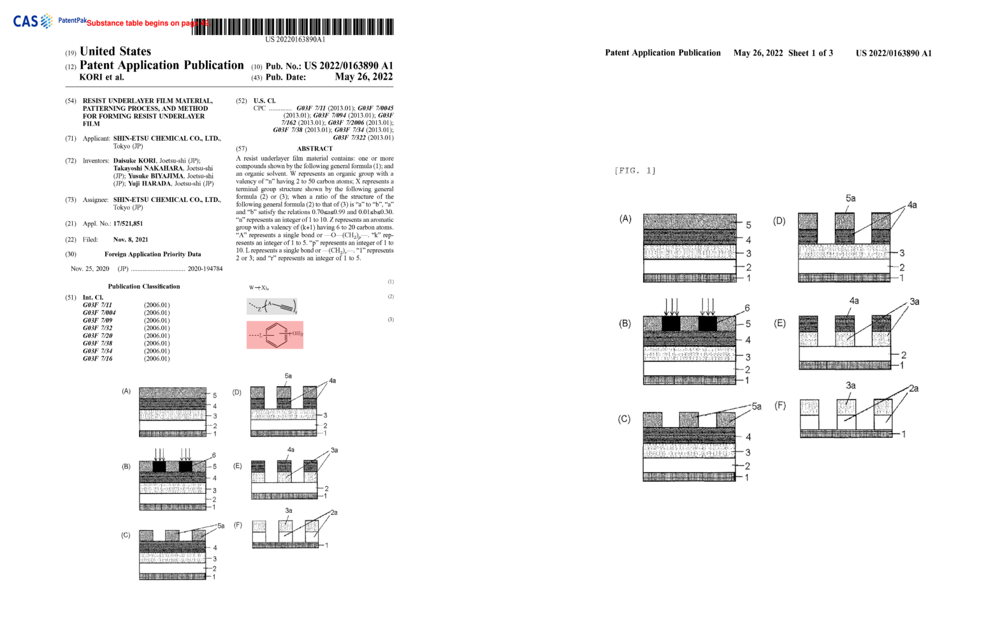

Molecules in page 3
Molecules in page 4


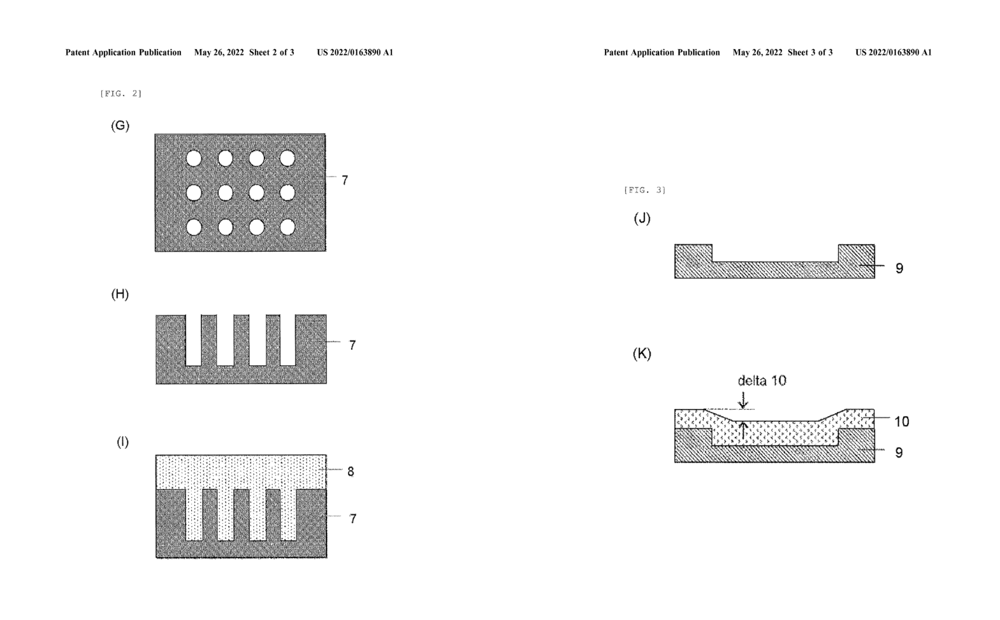

Molecules in page 5
Molecules in page 6


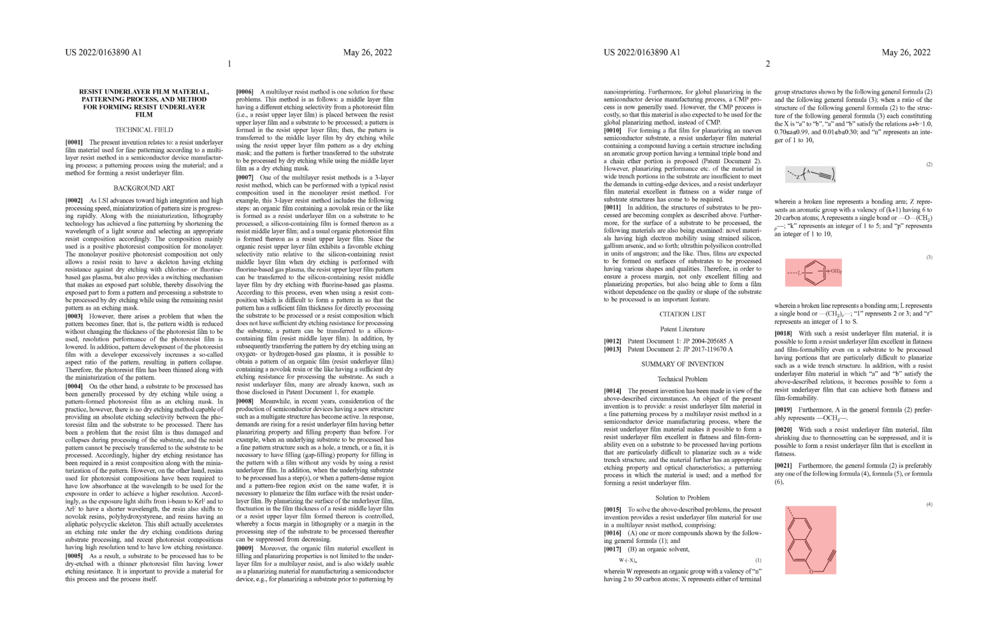

Molecules in page 7
0: COC1=CC=C(OC)C=C1
1: COC1=CC=C(C2(C3=CC=C(OC)C=C3)C3=C(C=CC=C3)C3=C2C=CC=C3)C=C1
2: COC1=CC=C(SC2=CC=C(OC)C=C2)C=C1
Molecules in page 8
3: COC1=CC=C(C2=CC=C(OC)C=C2)C=C1
4: COC1=CC(OC2=C(F)C(F)=C(OC3=CC=CC(OC)=C3)C(F)=C2F)=CC=C1
5: COC1=C(C)C=C(C2=CC(C)=C(OC)C(C)=C2)C=C1C
6: COC1=CC=CC=C1C(=O)N1CCN(C(=O)C2=CC=CC=C2OC)CC1
7: COC1=CC2=CC=CC(OC)=C2C=C1
8: COCCC(C)OC
9: COCCCCCCOC
10: COC1=CC=C(C2(C3=CC(C)=C(OC)C=C3)C3=C(C=CC=C3)C3=C2C=CC=C3)C=C1C
11: COC1=C(CC2=CC=C3C=CC=CC3=C2OC)C=CC2=C1C=CC=C2
12: COC1=CC=CC=C1OC
13: COC1=CC=C2C=CC=CC2=C1CC1=C(OC)C=CC2=C1C=CC=C2
14: COC1=CC2=C(C=C1)C=CC(OC)=C2CC1=C2C=C(OC)C=CC2=CC=C1OC
15: COCC1CCC(COC)CC1


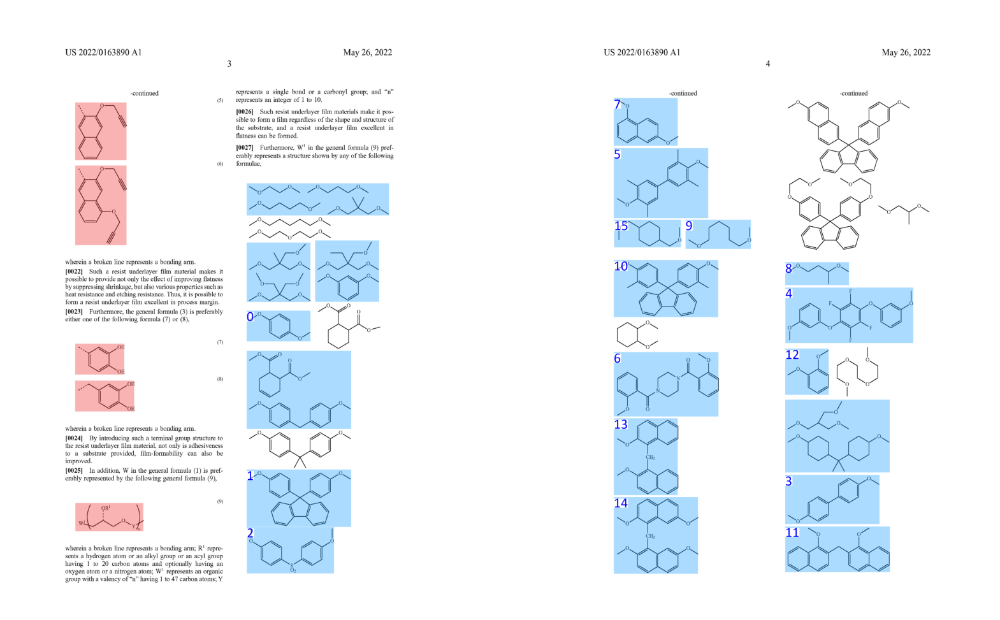

Molecules in page 9
16: COC1=C(C)C2=C(OC3=C(C(C)=C(OC)C(C)=C3C)C2C2=CC=CC=C2)C(C)=C1C
17: COC1=CC=C(C(C2=CC=C(OC)C=C2)C2=CC=C(OC)C=C2)C=C1
18: CN1C(=O)N(C)C(=O)N(C)C1=O
19: COC1=CC=C(C(C2=CC=C(OC)C=C2)C(C2=CC=C(OC)C=C2)C2=CC=C(OC)C=C2)C=C1
20: C=CC(=O)OC(COC)COC
21: COC1C2=C(C=CC=C2)C(OC)C2=C1C=CC=C2
22: COC(=O)C1=CC=CC(C(=O)OC)=C1
23: COC(=O)CCCCC(=O)OC
24: C=CC(=O)OCC(COC(COC)COC)OC(=O)C=C
25: COCCN(CCOC)C1=CC=CC=C1
26: CN1C(=O)C2=CC3=C(C=C2C1=O)C(=O)N(C)C3=O
27: C=CCN1C(=O)N(C)C(=O)N(C)C1=O
28: CN1C(=O)N(C)C(C)(C)C1=O
29: CCCCCCCC(CCCCCCC1=CC=C(OC)C=C1)CC1=CC=C(OC)C=C1
30: COCC(COC)(COC)COCC(COC)(COC)COCC(COC)(COC)COC
Molecules in page 10
31: COCC(C)OCC(C)OCC(C)OC
32: CN1C(=O)N(C)C(=O)N(C)C1=O
33: CN1C(=O)N(C)C2C1N(C)C(=O)N2C
34: C=CCN1C(=O)N(CC=C)C2C1N(C)C(=O)N2C
35: COC1=CC=C(C(C)(C)C2=CC(C)=C(OC)C=C2)C=C1C


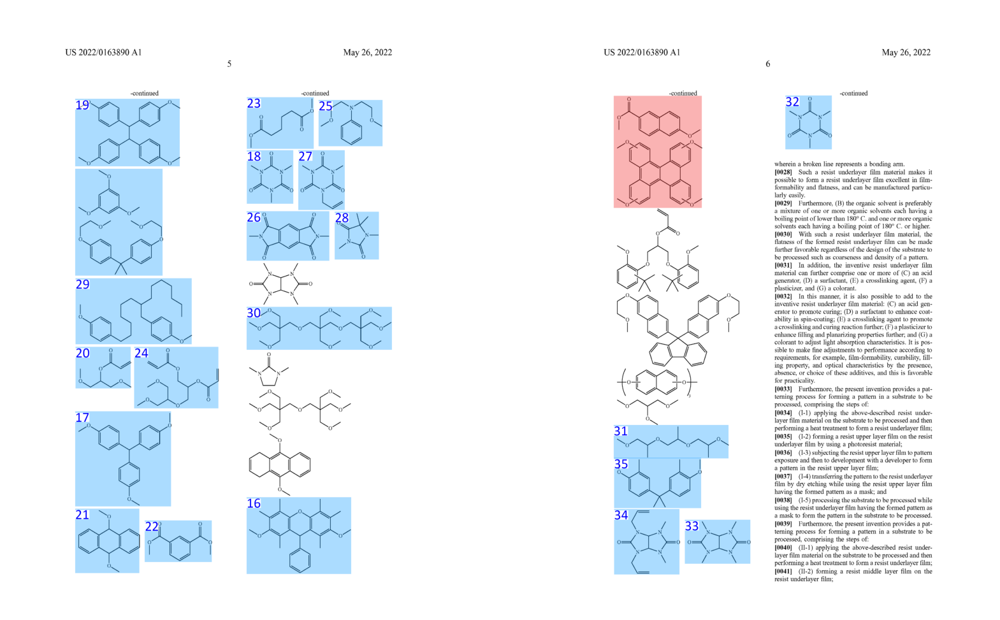

Molecules in page 11
Molecules in page 12


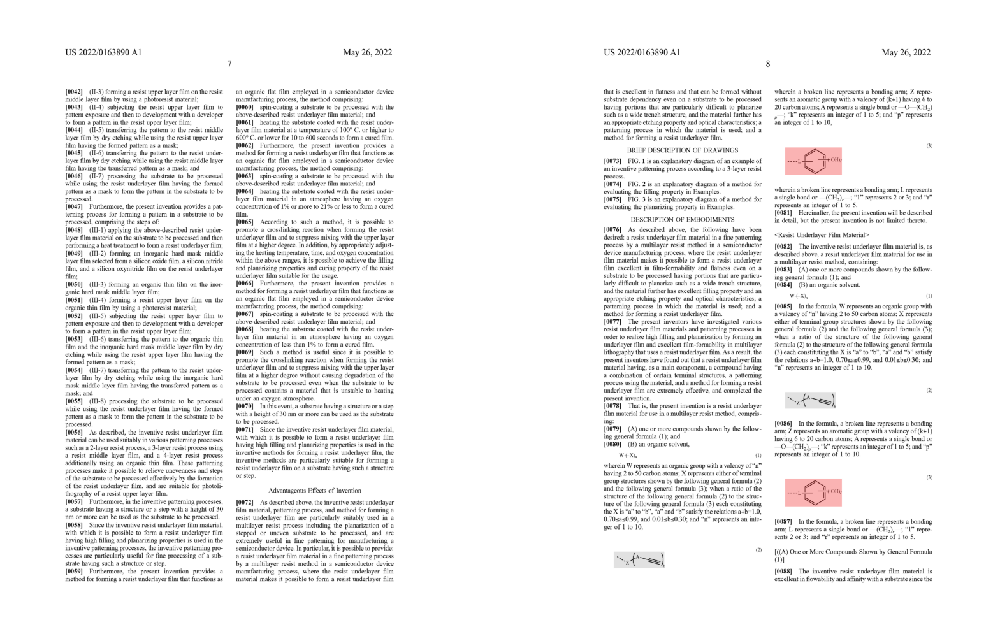

Molecules in page 13
Molecules in page 14
36: C=CC1=CC=C(O)C(O)=C1


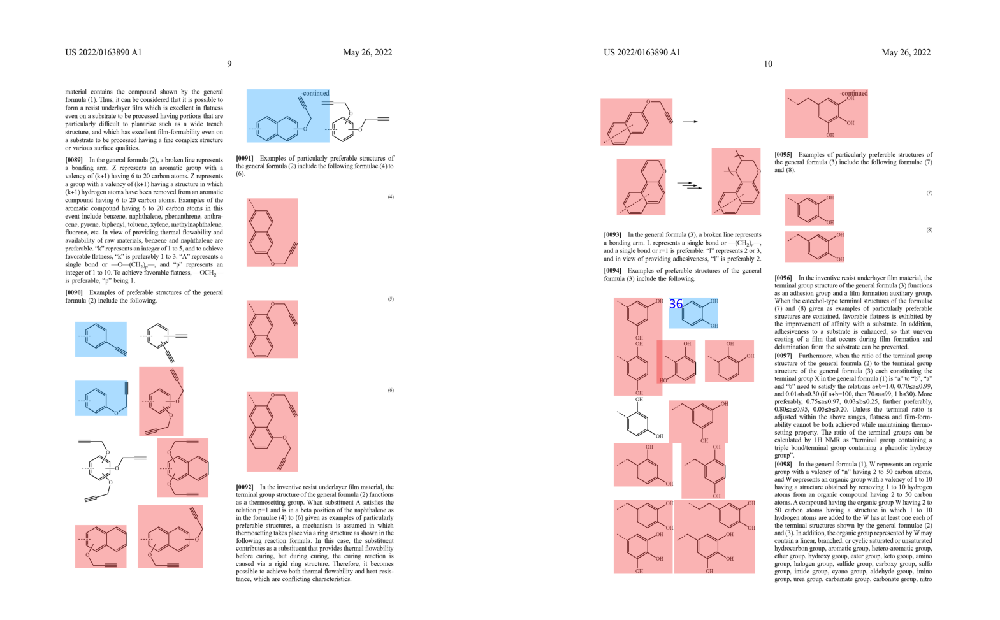

Molecules in page 15
37: COC1=CC=C(SC2=CC=C(OC)C=C2)C=C1
38: COC1=CC2=CC=CC(OC)=C2C=C1
39: COC1=CC=C(C2(C3=CC=C(OC)C=C3)C3=C(C=CC=C3)C3=C2C=CC=C3)C=C1
Molecules in page 16
40: COC1=CC=C(C2=CC=C(OC)C=C2)C=C1
41: COC1=CC(OC2=C(F)C(F)=C(OC3=CC=CC(OC)=C3)C(F)=C2F)=CC=C1
42: COC1=CC=CC=C1C(=O)N1CCN(C(=O)C2=CC=CC=C2OC)CC1
43: COCCC(C)OC
44: COCCOC1=CC=C(C2(C3=CC=C(OCCOC)C=C3)C3=C(C=CC=C3)C3=C2C=CC=C3)C=C1
45: COC1=CC=CC=C1OC
46: COCC1CCC(COC)C(C2=CC(C3=CC(C)=C(OC)C(C)=C3)=CC(C)=C2OC)C1
47: COCC(C)OC


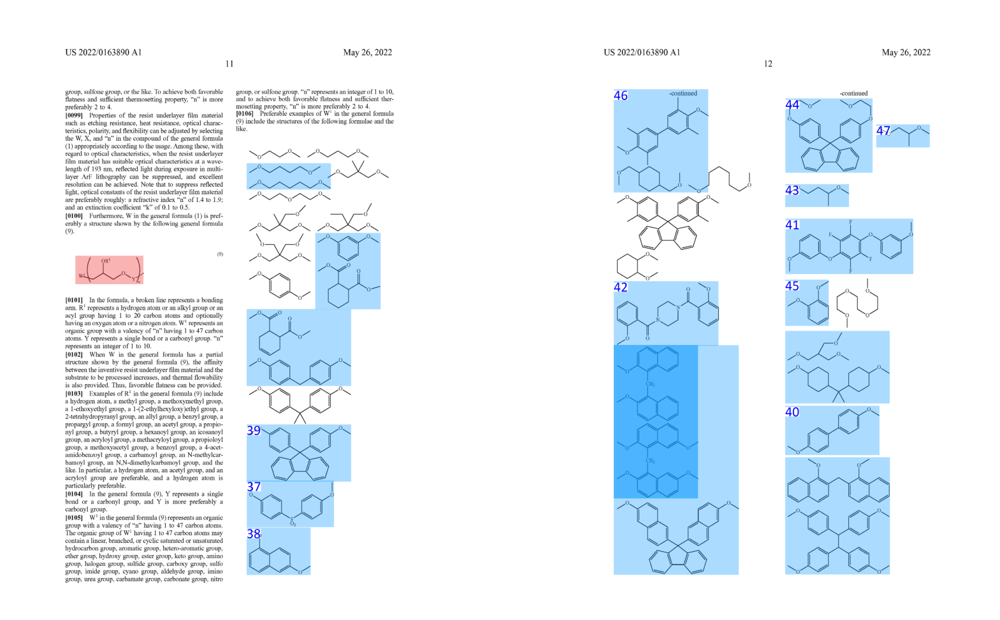

Molecules in page 17
48: COC1=C(C)C2=C(OC3=C(C(C)=C(OC)C(C)=C3C)C2C2=CC=CC=C2)C(C)=C1C
49: COC1C2=C(C=CC=C2)C(OC)C2=C1C=CC=C2
50: CN1C(=O)N(C)C(=O)N(C)C1=O
51: COC(=O)C1=CC=CC(C(=O)OC)=C1
52: COC(=O)CCCCC(=O)OC
53: C=CCN1C(=O)N(C)C(=O)N(C)C1=O
54: COCC(COC)(COC)COCC(COC)(COC)COCC(COC)(COC)COC
55: CN1C(=O)C2=CC3=C(C=C2C1=O)C(=O)N(C)C3=O
56: COC(=O)C1=CC=C2C=C(OC)C=CC2=C1
57: COC1=CC(OC)=CC(OC)=C1
58: COC1=CC=C(C(C2=CC=C(OC)C=C2)C2=CC=C(OC)C=C2)C=C1
59: COCCN(CCOC)C1=CC=CC=C1
60: CCCCCCCC(CCCCCCC1=CC=C(OC)C=C1)CC1=CC=C(OC)C=C1
61: COCCOC1=CC=C(C(C)(C)C2=CC=C(OCCOC)C=C2)C=C1
62: CN1C(=O)N(C)C2C1N(C)C(=O)N2C
63: CN1C(=O)N(C)C(C)(C)C1=O
64: C=CC(=O)OC(COC)COC
65: C=CC(=O)OCC(COC(COC)COC)OC(=O)C=C
Molecules in page 18
66: CN1C(=O)N(C)C2C1N(C)C(=O)N2C
67: C=CCN1C(=O)N(CC=C)C2C1N(C)C(=O)N2C
68: CN1C(=O)N(C)C(=O)N(C)C1=O
69: COCC(C)OCC(C)OCC(C)OC
70: COC1=CC=C(C(C)(C)C2=CC(C)=C(OC)C=C2)C=C1C


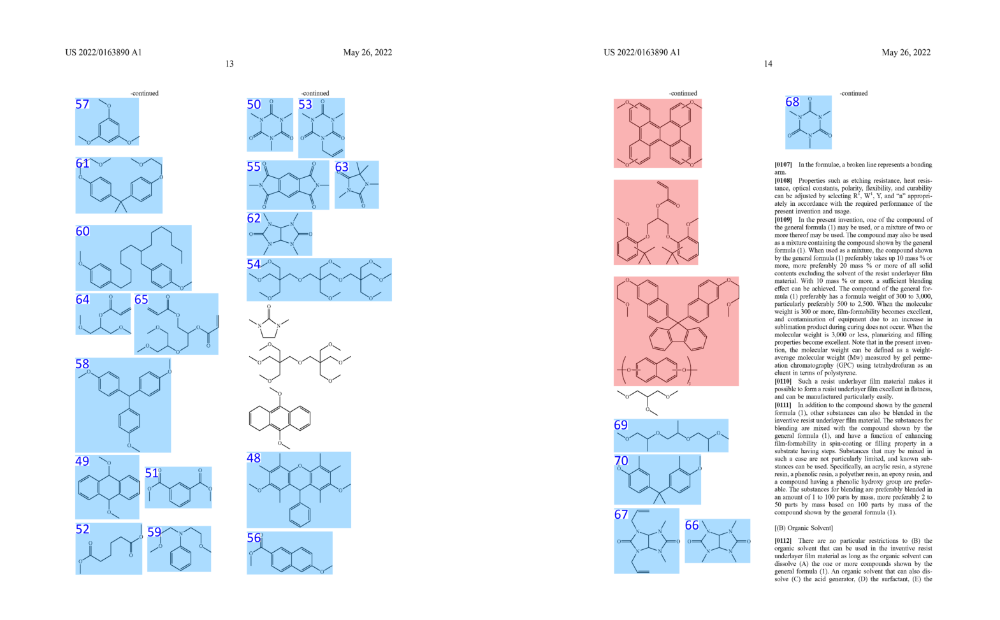

Molecules in page 19
Molecules in page 20


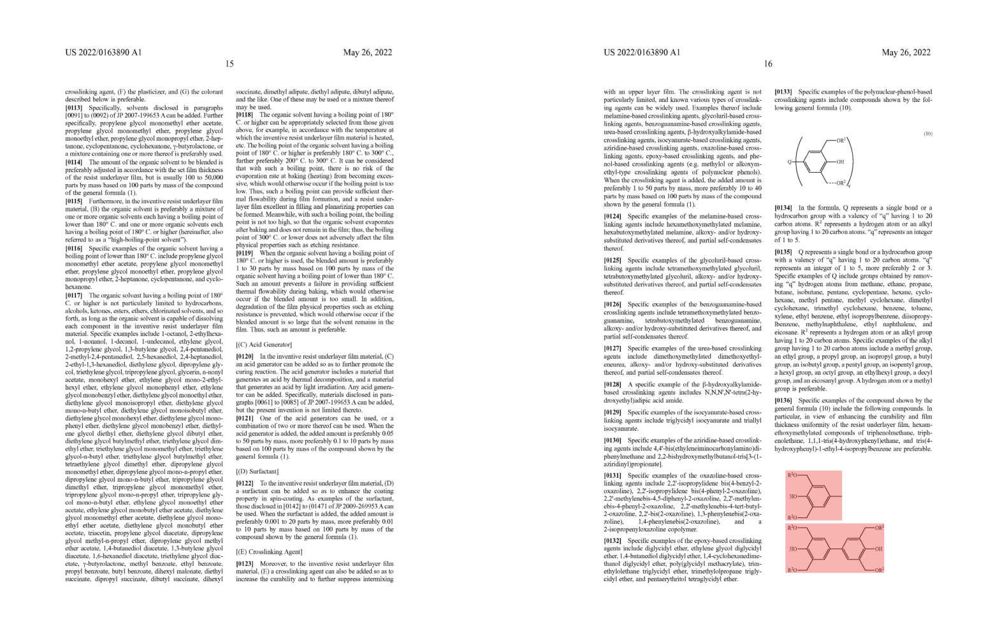

Molecules in page 21
Molecules in page 22


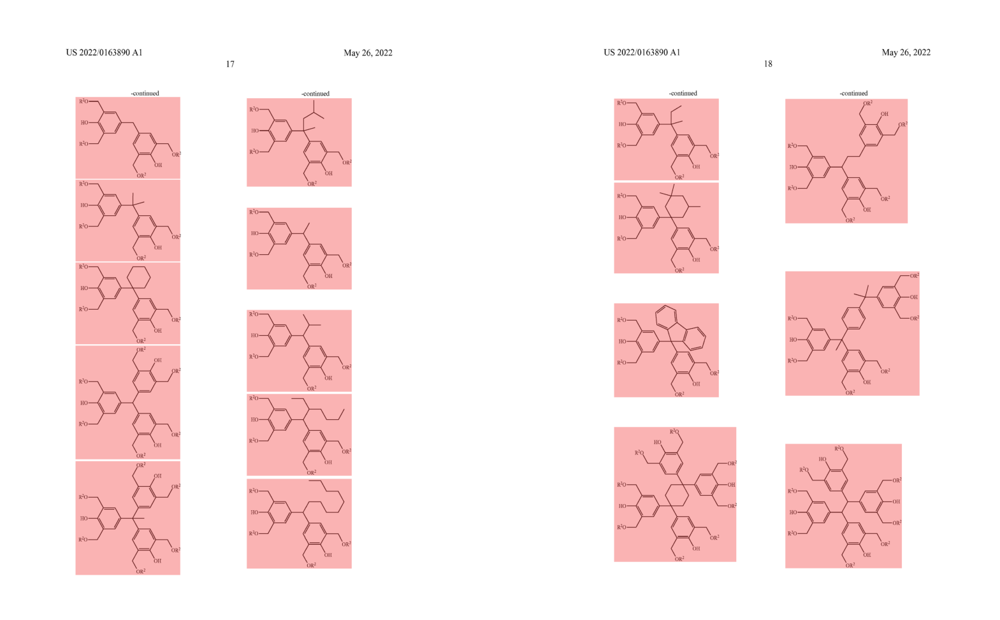

Molecules in page 23
71: CCC1=CC(C(C2=CC=C(C(C3=CC(CC)=C(O)C(CC)=C3)C3=CC(CC)=C(O)C(CC)=C3)C=C2)C2=CC(CC)=C(O)C(CC)=C2)=CC(CC)=C1O
Molecules in page 24


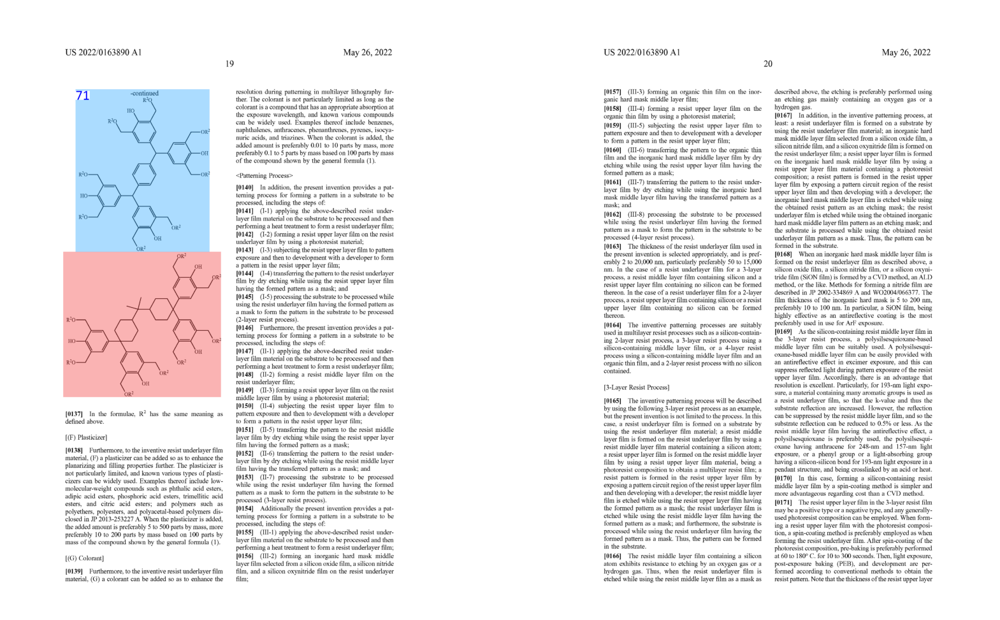

Molecules in page 25
Molecules in page 26
72: C#CC1=CC=C(C(=O)O)C=C1
73: C#CCOC1=CC=C2C=C(C(=O)O)C=CC2=C1
74: C#CCOC1=CC2=C(OCC#C)C=CC=C2C=C1C(=O)O
75: C#CCOC1=CC2=CC=CC=C2C=C1O


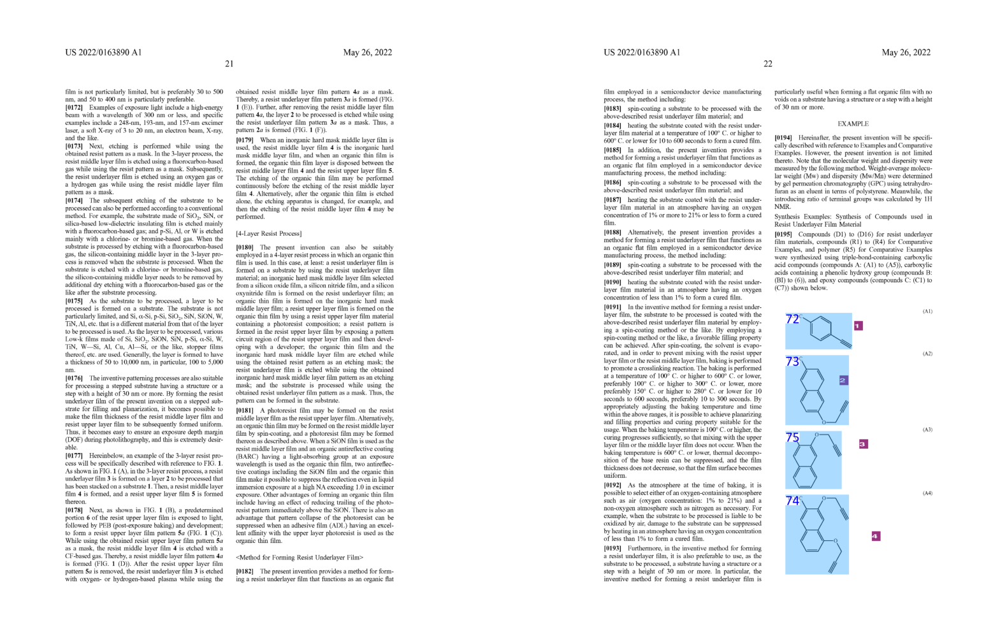

Molecules in page 27
76: O=C1N(CC2CO2)C(=O)N(CC2CO2)C(=O)N1CC1CO1
77: COC1=CC(CC(=O)O)=CC=C1O
78: O=C(O)CC1=CC=C(O)C(O)=C1
79: C=CCN1C(=O)N(CC2CO2)C(=O)N(CC2CO2)C1=O
80: CC(C)(C1=CC=C(OCC2CO2)C=C1)C1=CC=C(OCC2CO2)C=C1
81: C#CCOC1=CC=C(C(=O)O)C=C1
82: O=C(O)C1=CC=C(O)C(O)=C1
83: O=C(O)C1=CC=C(O)C=C1
84: O=C(O)C1=CC(O)=CC(O)=C1
85: O=C(O)C1=CC(O)=C(O)C(O)=C1
86: C1=CC2=CC=C(OCC3CO3)C(CC3=C(OCC4CO4)C=CC4=CC=C(OCC5CO5)C=C43)=C2C=C1OCC1CO1
87: C(OCC(COCC1CO1)(COCC1CO1)COCC1CO1)C1CO1
88: C1=CC2=C(C=C1)C(C1=CC=C(OCC3CO3)C=C1)(C1=CC=C(OCC3CO3)C=C1)C1=C2C=CC=C1
89: C1=CC2=CC=C(OCC3CO3)C(CC3=C(OCC4CO4)C=CC4=CC=C(OCC5CO5)C=C43)=C2C=C1OCC1CO1
90: C1=CC2=CC=C(OCC3CO3)C(CC3=C4C=CC=CC4=CC=C3OCC3CO3)=C2C=C1
Molecules in page 28
91: C#CC1=CC=C(C(C)=O)C=C1
92: CC(=O)C1=CC(O)=CC(O)=C1
93: CC(=O)C1=CC(O)=CC=C1
94: C#CC1=CC=C(C(C)=O)C=C1


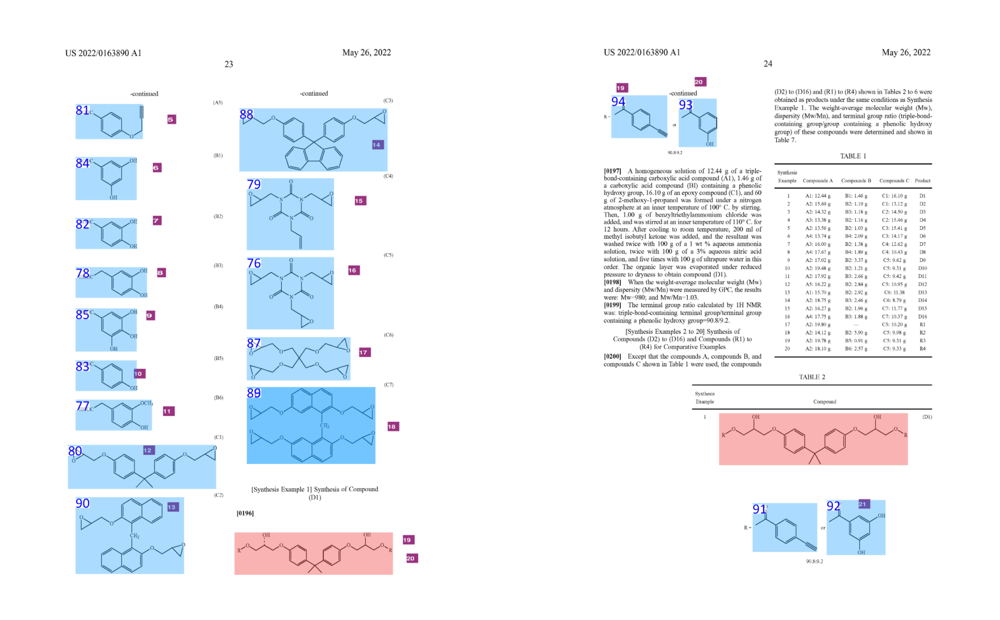

Molecules in page 29
95: CC(=O)C1=CC=C(O)C(O)=C1
96: CC(=O)CC1=CC=C(O)C(O)=C1
97: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1
98: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1
Molecules in page 30
99: CC(=O)C1=CC=C(O)C(O)=C1
100: CC(=O)C1=CC=C(O)C(O)=C1
101: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1


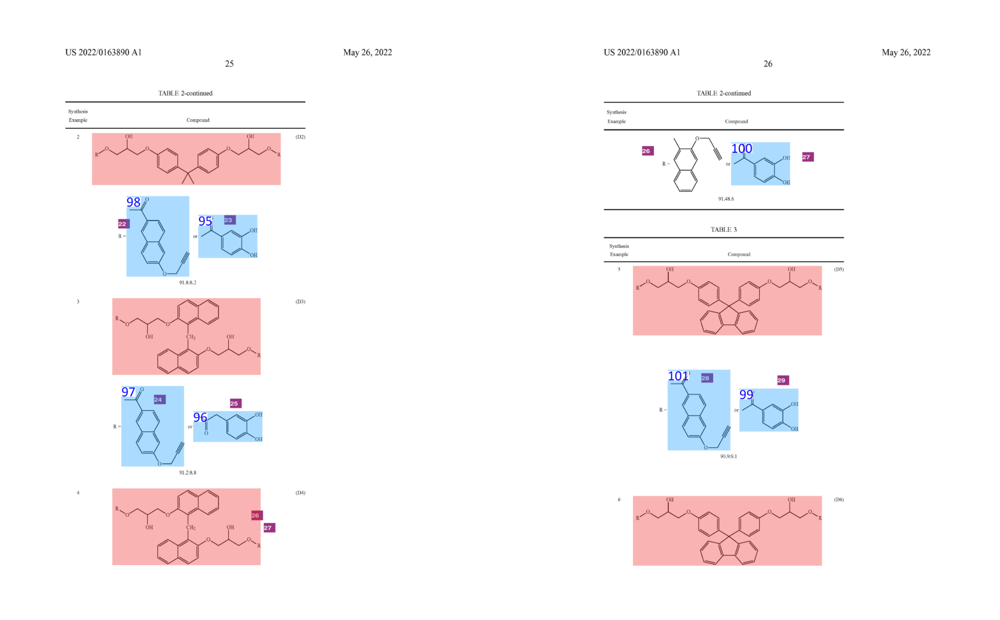

Molecules in page 31
102: CC(=O)C1=CC(O)=C(O)C(O)=C1
103: CC(=O)C1=CC(O)=C(O)C(O)=C1
104: CC(=O)C1=CC=C(O)C(O)=C1
105: C#CCOC1=CC2=C(OCC#C)C=CC=C2C=C1C(C)=O
106: C#CCOC1=CC2=C(OCC#C)C=CC=C2C=C1C(C)=O
107: C#CCOC1=CC2=CC=CC=C2C=C1C(C)=O
Molecules in page 32
108: CC(=O)C1=CC=C(O)C(O)=C1
109: CC(=O)C1=CC=C(O)C(O)=C1
110: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1
111: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1


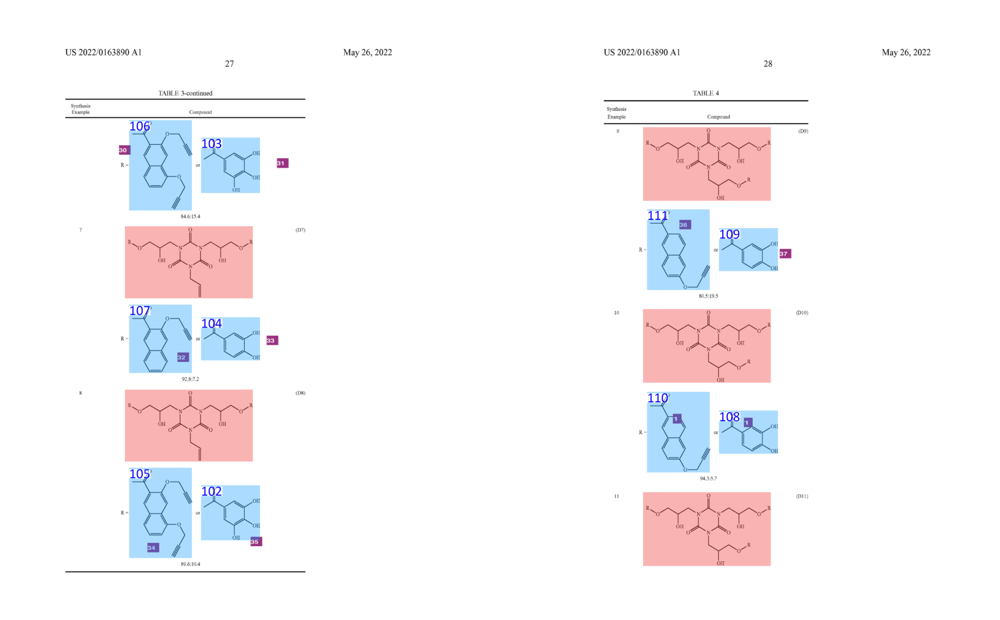

Molecules in page 33
112: C#CC1=CC=C(C(C)=O)C=C1
113: CC(=O)C1=CC=C(O)C(O)=C1
114: CC(=O)CC1=CC=C(O)C(O)=C1
115: CC(=O)C1=CC=C(O)C(O)=C1
116: C#CCOC1=CC=C(C(C)=O)C=C1
117: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1
Molecules in page 34
118: CC(=O)C1=CC=C(O)C(O)=C1
119: CC(=O)CC1=CC=C(O)C(O)=C1
120: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1
121: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1


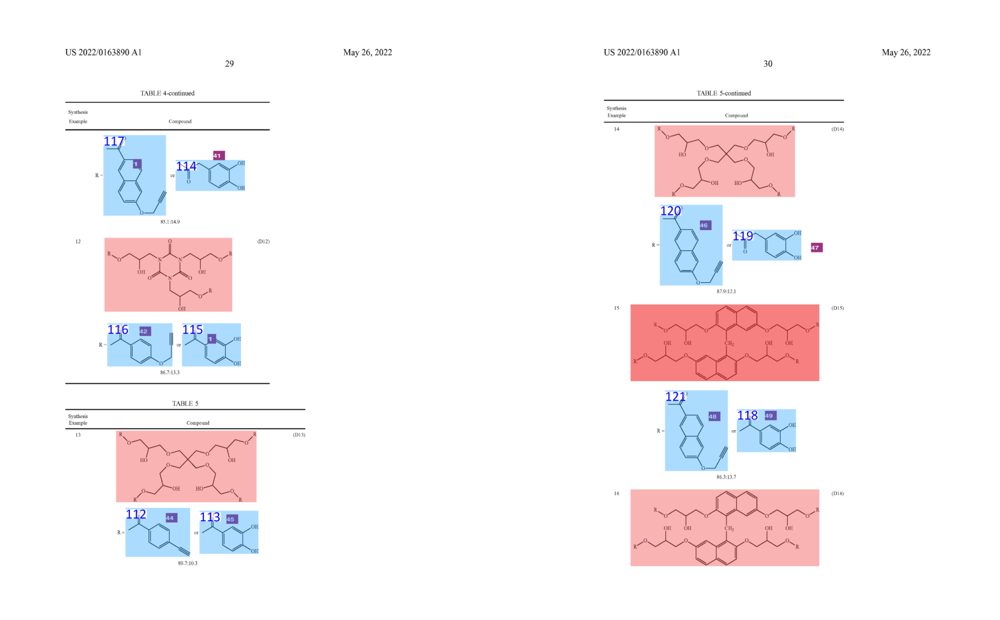

Molecules in page 35
122: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1
123: CC(=O)CC1=CC=C(O)C(O)=C1
124: C#CCOC1=CC2=C(OCC#C)C=CC=C2C=C1C(C)=O
Molecules in page 36
125: CC(=O)C1=CC=C(O)C=C1
126: CC(=O)C1=CC=C(O)C(O)=C1
127: COC1=CC(CC(C)=O)=CC=C1O
128: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1
129: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1
130: C#CCOC1=CC=C2C=C(C(C)=O)C=CC2=C1


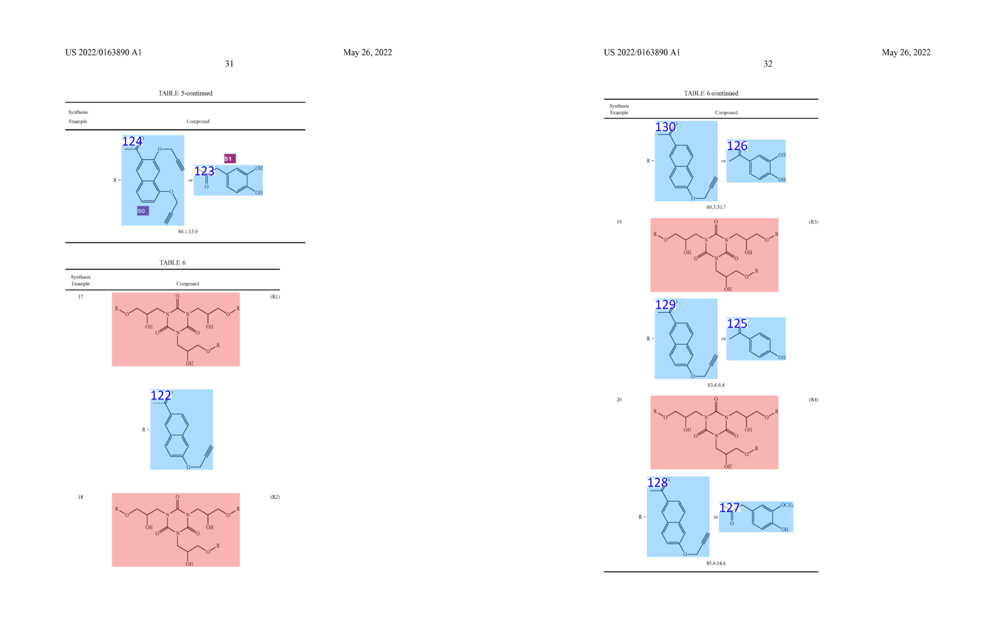

Molecules in page 37
Molecules in page 38


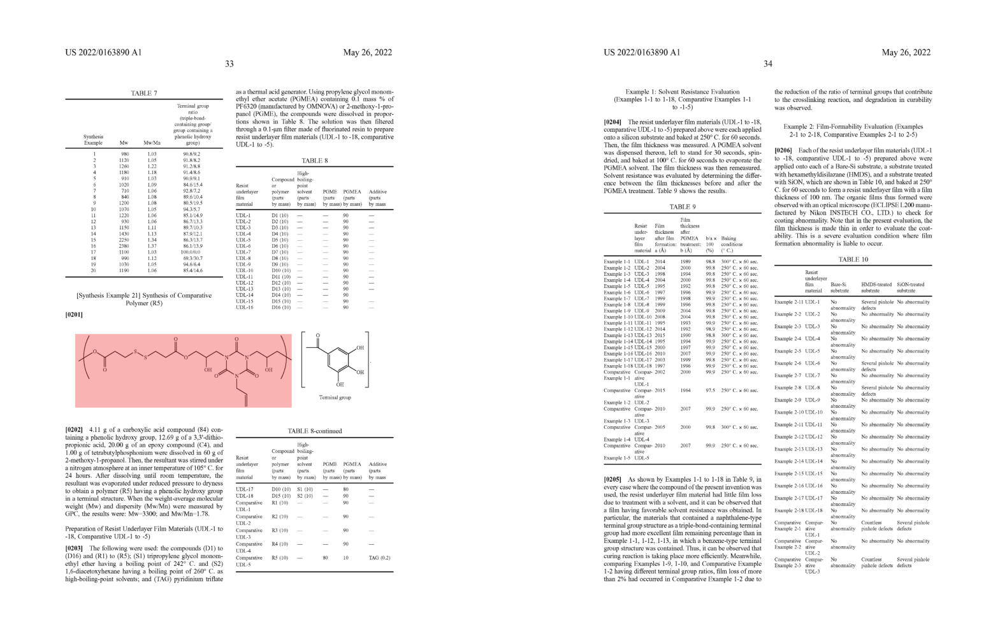

Molecules in page 39
Molecules in page 40
131: COCOCCN(CCOCOC)CCOCOC
132: C1=CC=C([S+](C2=CC=CC=C2)C2=CC=CC=C2)C=C1


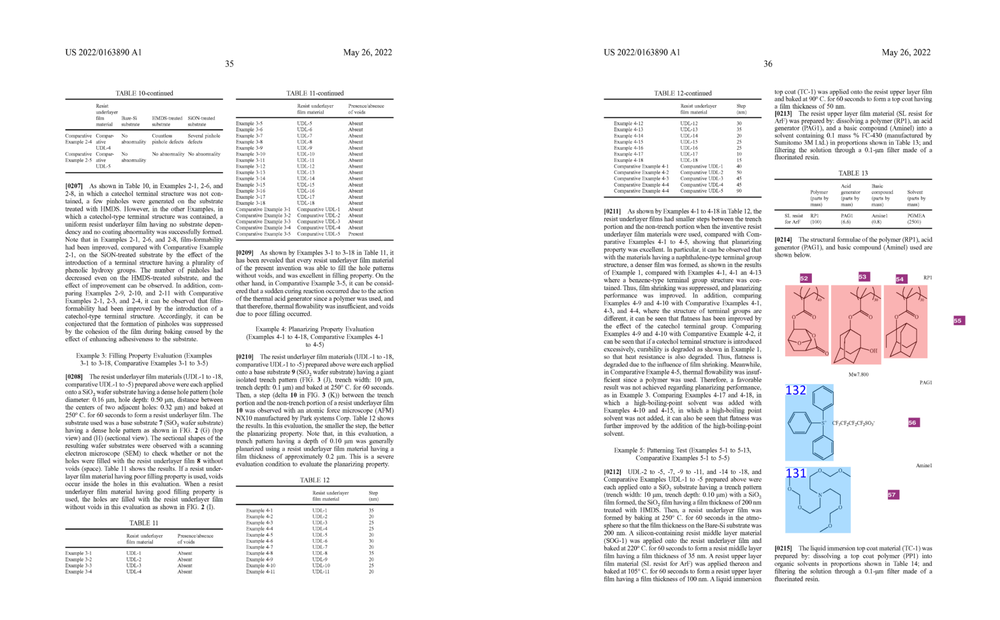

Molecules in page 41
133: C1=CC=C([S+](C2=CC=CC=C2)C2=CC=CC=C2)C=C1
Molecules in page 42


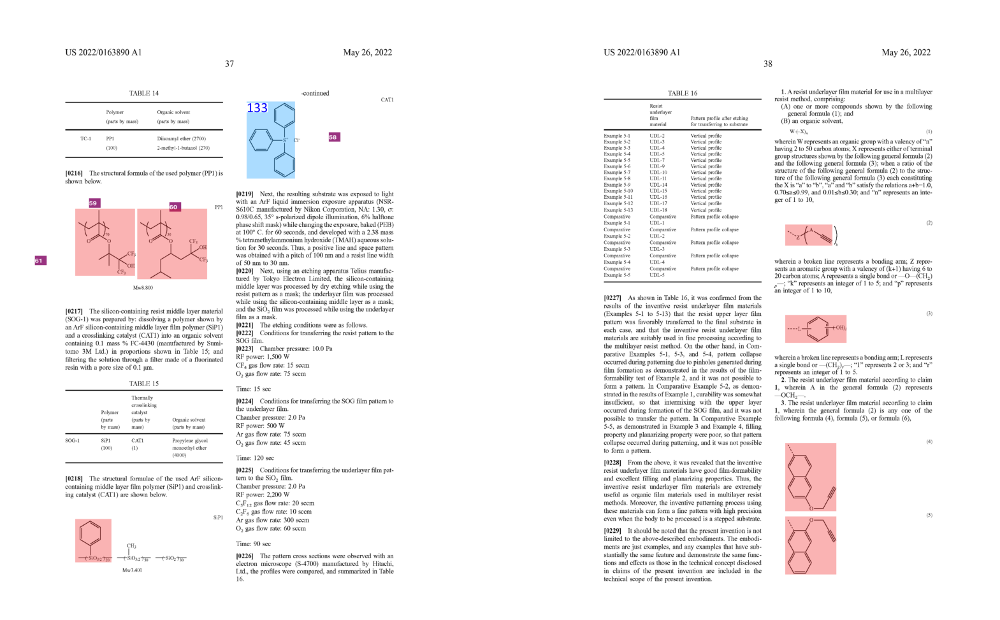

Molecules in page 43
134: CCC1=CC=C(O)C(O)=C1
135: C=CC1=CC=C(O)C(O)=C1
Molecules in page 44
136: COC1=CC=CC=C1C(=O)N1CCN(C(=O)C2=CC=CC=C2OC)CC1
137: COC1=C(C)C=C(C2=CC(C)=C(OC)C(C)=C2)C=C1C
138: COC1=CC=C(SC2=CC=C(OC)C=C2)C=C1
139: COC1=CC2=CC=CC(OC)=C2C=C1
140: COC1=CC=C(OC)C=C1
141: COCC1CCC(COC)CC1
142: COCCCCCCOC
143: COC1=CC=C2C=CC=CC2=C1CC1=C(OC)C=CC2=C1C=CC=C2
144: COC1=CC=C(C2(C3=CC(C)=C(OC)C=C3)C3=C(C=CC=C3)C3=C2C=CC=C3)C=C1C
145: COC1=CC=C(C2(C3=CC=C(OC)C=C3)C3=C(C=CC=C3)C3=C2C=CC=C3)C=C1


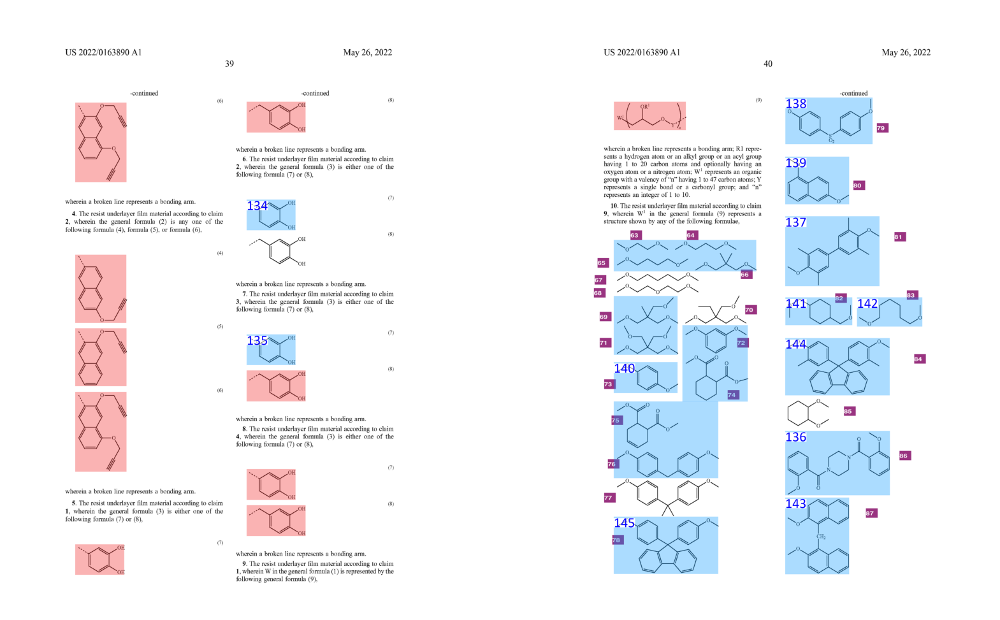

Molecules in page 45
146: COC1=CC(OC2=C(F)C(F)=C(OC3=CC=CC(OC)=C3)C(F)=C2F)=CC=C1
147: COC1=CC2=C(C=C1)C=CC(OC)=C2CC1=C2C=C(OC)C=CC2=CC=C1OC
148: COC1=C(CC2=CC=C3C=CC=CC3=C2OC)C=CC2=C1C=CC=C2
149: COC1=CC=C(C(C2=CC=C(OC)C=C2)C2=CC=C(OC)C=C2)C=C1
150: C=CC(=O)OCC(COC(COC)COC)OC(=O)C=C
151: COC1=CC=C(C(C2=CC=C(OC)C=C2)C(C2=CC=C(OC)C=C2)C2=CC=C(OC)C=C2)C=C1
152: C=CC(=O)OC(COC)COC
153: COCC(C)OC
154: COC1=CC=CC=C1OC
155: CCCCCCCC(CCCCCCC1=CC=C(OC)C=C1)CC1=CC=C(OC)C=C1
156: COC1CCC(C(C)(C)C2CCC(OC)CC2)CC1
157: COCCOCCOCCOC
Molecules in page 46
158: CN1C(=O)N(C)C(=O)N(C)C1=O
159: COC(=O)CCCCC(=O)OC
160: COC1C2=C(C=CC=C2)C(OC)C2=C1C=CC=C2
161: COCC(C)OCC(C)OCC(C)OC
162: CN1C(=O)N(C)C2C1N(C)C(=O)N2C
163: CN1C(=O)C2=CC3=C(C=C2C1=O)C(=O)N(C)C3=O
164: CN1C(=O)N(C)C(C)(C)C1=O
165: COC(=O)C1=CC=CC(C(=O)OC)=C1
166: C=CCN1C(=O)N(C)C(=O)N(C)C1=O
167: COC1=C(C)C2=C(OC3=C(C(C)=C(OC)C(C)=C3C)C2C2=CC=CC=C2)C(C)=C1C
168: COC(=O)C1=CC=C2C=C(OC)C=CC2=C1
169: COCCN(CCOC)C1=CC=CC=C1
170: COCC(COC)(COC)COCC(CO

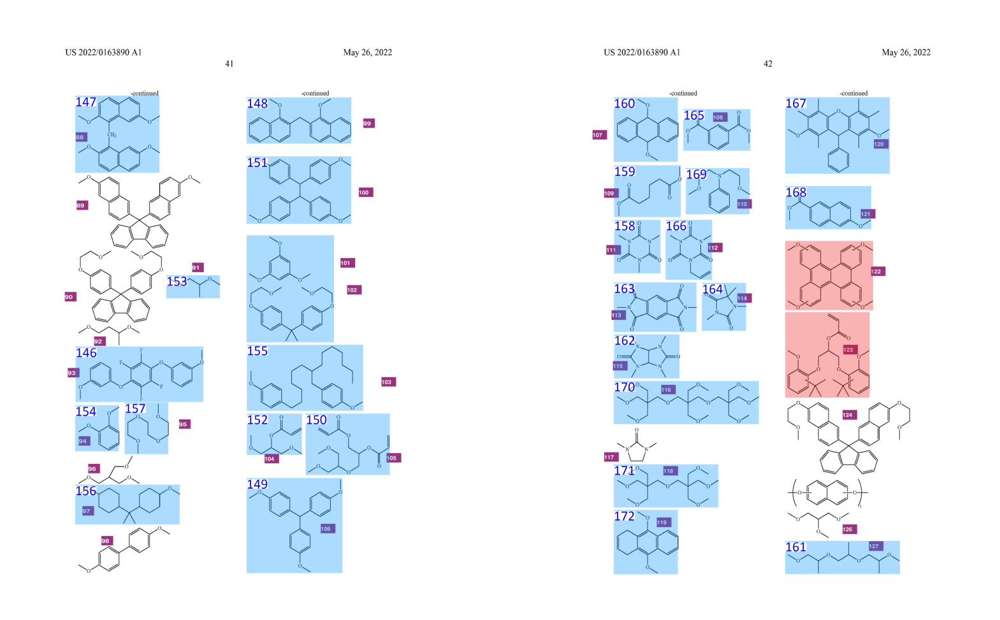

Molecules in page 47
173: CN1C(=O)N(C)C2C1N(C)C(=O)N2C
174: COC1=CC=C(C(C)(C)C2=CC(C)=C(OC)C=C2)C=C1C
Molecules in page 48


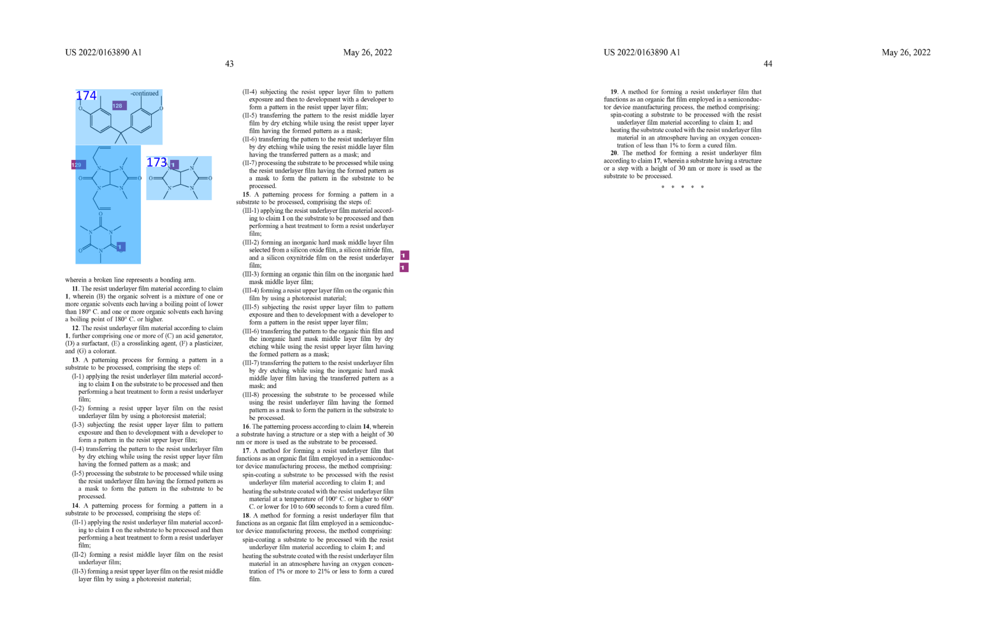

defaultdict(<class 'list'>, {})


In [8]:
if not(os.path.exists(os.getcwd() + f"/../data/pdfs/{query_patent}.pdf")):
    print(os.getcwd() + f"/../data/pdfs/{query_patent}.pdf not found. To display molecules locations, it is first needed to download the document .pdf on the patent office website.")

# Convert pdf to page images
pages = convert_from_path(os.getcwd() + f"/../data/pdfs/{query_patent}.pdf", dpi=200)

# Display pages and molecules (To display more pages, modify max_pages_displayed)
display_molecules_locations(pages, patent_entry, max_pages_per_row=2, max_pages_displayed=200, highlight_smiles_list=highligh_smiles_list)